In [1]:
!pip -q install opencv-python==4.11.0.86

    kubernetes (>=9.0.0a1.0) ; extra == 'all_extras'
               ~~~~~~~~~~^


In [2]:
from pystac_client import Client
import geopandas as gpd
import xarray as xr
import folium
from odc.geo import Geometry
from odc.stac import load
from src import util

In [3]:
catalog = "https://stac.digitalearthpacific.org"
client = Client.open(catalog)

In [88]:
year = "2024"
aoi = Geometry(gpd.read_file("aoi/aoi_test_VU_3.geojson").geometry[0], crs="EPSG:4326")
aoi.explore()

In [89]:
items = list(
    client.search(collections=["dep_s2_geomad"], datetime=year, intersects=aoi).items()
)

print(f"Found {len(items)} items")

Found 1 items


In [90]:
data = load(
    items,
    measurements=[
        "nir",
        "red",
        "blue",
        "green",
        "green",
        "swir16",
    ],
    intersects=aoi,
    resolution=10,
    chunks={"x": 2048, "y": 2048},
    groupby="solar_day",
)

data

<xarray.Dataset> Size: 26MB
Dimensions:      (y: 1361, x: 1884, time: 1)
Coordinates:
  * y            (y) float64 11kB -1.992e+06 -1.992e+06 ... -2.005e+06
  * x            (x) float64 15kB 2.032e+06 2.032e+06 ... 2.051e+06 2.051e+06
    spatial_ref  int32 4B 3832
  * time         (time) datetime64[ns] 8B 2024-01-01
Data variables:
    nir          (time, y, x) uint16 5MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>
    red          (time, y, x) uint16 5MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>
    blue         (time, y, x) uint16 5MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>
    green        (time, y, x) uint16 5MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>
    swir16       (time, y, x) uint16 5MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>

In [91]:
# scale
data = (data.where(data != 0) * 0.0001).clip(0.0001, 1)

### AMMI

Automatic Mangrove Map and Index (AMMI)
Suyarso (2022) developed a mangrove vegetation index that
simultaneously extracts mangroves and computes canopy density
precisely using optical satellite imagery, e.g., Sentinel-2 and
Landsat-5, Landsat-7, and Landsat-8. The algorithm is the
product of two equations. The first equation should separate the
land and vegetation from water features. The second equation
should map the extent of mangroves and display the canopy
density. The proponent did not provide a threshold range but
from his results, it was between 5 to 10.

In [92]:
nir = data["nir"]
swir = data["swir16"]
red = data["red"]
green = data["green"]
blue = data["blue"]

ammi = ((nir - red) / (red + swir)) * ((nir - swir) / (swir - 0.65 * red))

ammi = ammi.to_dataset(name="ammi")

ammi

<xarray.Dataset> Size: 10MB
Dimensions:      (y: 1361, x: 1884, time: 1)
Coordinates:
  * y            (y) float64 11kB -1.992e+06 -1.992e+06 ... -2.005e+06
  * x            (x) float64 15kB 2.032e+06 2.032e+06 ... 2.051e+06 2.051e+06
    spatial_ref  int32 4B 3832
  * time         (time) datetime64[ns] 8B 2024-01-01
Data variables:
    ammi         (time, y, x) float32 10MB dask.array<chunksize=(1, 1361, 1884), meta=np.ndarray>

Spatially, the AMMI captures the mangroves from sparse mangroves, indicated by the low spectral sensitivity with an index of about 5, to dense mangroves (>20), and the index below 5 is classified as nonmangrove.

https://onlinelibrary.wiley.com/doi/10.1155/2022/8103242

In [93]:

# AMMI_THRESHOLD = 4.0 - 20
AMMI_THRESHOLD = range(4, 20)

mangrove_mask = ammi.ammi >= list(AMMI_THRESHOLD)[0]

num_vals = len(AMMI_THRESHOLD)
for i, val in enumerate(AMMI_THRESHOLD, 1):
    # print(f"{i}: {val}")
    density_percentage = 10 + (i - 1) * (90 / (num_vals - 1))
    mangrove_mask = xr.where(ammi.ammi >= val, density_percentage, mangrove_mask)
    

# Convert boolean mask to uint8 (0/1) and attach geospatial metadata for saving
mangrove_mask = mangrove_mask.astype("uint8")
mangrove_mask = mangrove_mask.compute()

# remove null
data["mangroves"] = mangrove_mask.where(mangrove_mask != 0, drop=True)
data["mangroves"]

<xarray.DataArray 'mangroves' (time: 1, y: 1361, x: 1884)> Size: 10MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * y            (y) float64 11kB -1.992e+06 -1.992e+06 ... -2.005e+06
  * x            (x) float64 15kB 2.032e+06 2.032e+06 ... 2.051e+06 2.051e+06
  * time         (time) datetime64[ns] 8B 2024-01-01
    spatial_ref  int32 4B 3832

### Apply Morphological Filter

In [94]:
CLOSING_KERNEL_SIZE = 2
OPENING_KERNEL_SIZE = 5

#data['mangroves'] = util.filter_mask(closing_kernel_size=CLOSING_KERNEL_SIZE, opening_kernel_size=OPENING_KERNEL_SIZE, mask=data['mangroves'])

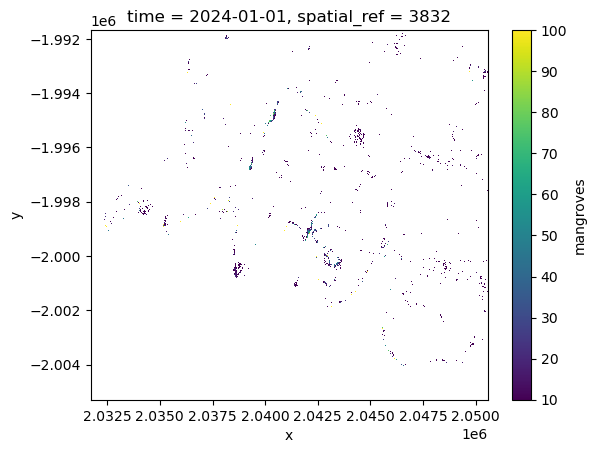

In [95]:
data["mangroves"].plot()

### Visual Verification

In [96]:
gdf = gpd.read_parquet("gmw_v4_pacific_validation.parquet")
aoi = aoi.to_crs(3832)
gdf = gdf.clip(aoi.geom, keep_geom_type=False)
gdf.COUNTRY.unique()

array(['Vanuatu'], dtype=object)

In [97]:
# Compute the RGB into memory
rgb_ds = data.odc.to_rgba(vmin=0, vmax=0.3, bands=("red", "green", "blue")).compute()

In [98]:
# Initialize the Folium map centered on the average centroid
x, y = aoi.centroid.to_crs("epsg:4326").xy
m = folium.Map(location=[float(y[0]), float(x[0])], zoom_start=10)

# GMW for Validation
# gdf.geometry.boundary.explore(m=m, color="red", name="GMWv4")
gdf.explore(m=m, 
            name="GMWv4",
            style_kwds=dict(
                fillOpacity=0.5,   # Sets the opacity of the fill color
                opacity=1.0,       # Sets the opacity of the outline color
                color="red",       # Outline color
                fillColor="green") # Fill color
            )

# RGB for Comparison
rgb_ds.odc.add_to(m, name="GeoMAD True Color")

# Mangrove Mask and Density
data["mangroves"].odc.add_to(m, cmap="magma", name="AMMI")

folium.LayerControl().add_to(m)

m

In [99]:
# Mangrove Mask and Density
data["mangroves"].odc.add_to(m, cmap="YlOrRd", name="AMMI")

folium.LayerControl().add_to(m)

m

### Export

In [15]:
data["mangroves"].odc.write_cog(f"output_{year}.tif", overwrite=True)

PosixPath('output_2024.tif')